
#  Binary Classification Tutorial with PyCaret

Reza Rezazadegan   
[dreamintelligent.com](dreamintelligent.com)

In [8]:
import pycaret
pycaret.__version__

'3.3.2'

# 🚀 Quick start

PyCaret’s Classification Module is a supervised machine learning module that is used for classifying elements into groups. The goal is to predict the categorical class labels which are discrete and unordered. 

Some common use cases include predicting customer default (Yes or No), predicting customer churn (customer will leave or stay), the disease found (positive or negative). 

This module can be used for binary or multiclass problems. It provides several pre-processing features that prepare the data for modeling through the setup function. It has over 18 ready-to-use algorithms and several plots to analyze the performance of trained models.

A typical workflow in PyCaret consist of following 5 steps in this order:

 **Setup** ➡️ **Compare Models** ➡️ **Analyze Model** ➡️ **Prediction** ➡️ **Save Model**

 In a binary classification problem we have two target classes which we can label as 0 and 1. 

In [4]:
# loading sample dataset from pycaret dataset module
from pycaret.datasets import get_data

data = get_data('diabetes')
data.columns

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Class variable
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


Index(['Number of times pregnant',
       'Plasma glucose concentration a 2 hours in an oral glucose tolerance test',
       'Diastolic blood pressure (mm Hg)', 'Triceps skin fold thickness (mm)',
       '2-Hour serum insulin (mu U/ml)',
       'Body mass index (weight in kg/(height in m)^2)',
       'Diabetes pedigree function', 'Age (years)', 'Class variable'],
      dtype='object')

,Number of times pregnant,Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Class variable
0,6,33.6,0.627,50,1
1,1,26.6,0.351,31,0
2,8,23.3,0.672,32,1
3,1,28.1,0.167,21,0
4,0,43.1,2.288,33,1
...,...,...,...,...,...
763,10,32.9,0.171,63,0
764,2,36.8,0.340,27,0
765,5,26.2,0.245,30,0
766,1,30.1,0.349,47,1


`Class variable` is the target of prediction. 0 means healthy, 1 means diabetic.

Other columns of the data are called the _features_. 
We have 9 features, all of them numeric. 

**Diabetes pedigree function** is a statistical measure used to assess the likelihood of an individual developing diabetes based on their family history. Values between 0 and 2.5.

## Setup
This function initializes the training environment and creates the transformation pipeline. Setup function must be called before executing any other function in PyCaret. It only has two required parameters i.e. `data` and `target`. All the other parameters are optional.

The option `normalize=True` normalizes the features so that all of them have the same range of values in [0,1] so that comparing them becomes easier. 

In [32]:
# import pycaret classification and init setup
from pycaret.classification import *

s = setup(data, target = 'Class variable', session_id = 123,  normalize=True, normalize_method = 'minmax')

,Description,Value
0,Session id,123
1,Target,Class variable
2,Target type,Binary
3,Original data shape,"(768, 9)"
4,Transformed data shape,"(768, 9)"
5,Transformed train set shape,"(537, 9)"
6,Transformed test set shape,"(231, 9)"
7,Numeric features,8
8,Preprocess,True
9,Imputation type,simple


In [33]:
setup?

Signature:
setup(
    data: Union[dict, list, tuple, numpy.ndarray, scipy.sparse._matrix.spmatrix, pandas.core.frame.DataFrame, NoneType] = None,
    data_func: Optional[Callable[[], Union[dict, list, tuple, numpy.ndarray, scipy.sparse._matrix.spmatrix, pandas.core.frame.DataFrame]]] = None,
    target: Union[int, str, list, tuple, numpy.ndarray, pandas.core.series.Series] = -1,
    index: Union[bool, int, str, list, tuple, numpy.ndarray, pandas.core.series.Series] = True,
    train_size: float = 0.7,
    test_data: Union[dict, list, tuple, numpy.ndarray, scipy.sparse._matrix.spmatrix, pandas.core.frame.DataFrame, NoneType] = None,
    ordinal_features: Optional[Dict[str, list]] = None,
    numeric_features: Optional[List[str]] = None,
    categorical_features: Optional[List[str]] = None,
    date_features: Optional[List[str]] = None,
    text_features: Optional[List[str]] = None,
    ignore_features: Optional[List[str]] = None,
    keep_features: Optional[List[str]] = None,
    prepro

Once the setup has been successfully executed it shows the information grid containing experiment level information. 


## Cross-validation (or k-fold cross validation)
We split the dataset into k equal-sized parts. Each time we use the i'th part for testing and the rest for training. We then average the results (accuracy, precision, etc.) of the k experiments.  

## Compare Models

This function trains and evaluates the performance of all the estimators available in the model library using cross-validation. 
The output of this function is a scoring grid with average cross-validated scores. 

On the left we have a list of models tested, on the right we have several metrics that evaluate the models. 

In [34]:
# compare baseline models
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.7708,0.8071,0.5392,0.7353,0.6203,0.4618,0.4744,0.0100
lr,Logistic Regression,0.7689,0.8071,0.4959,0.7614,0.5968,0.4453,0.4673,0.9050
lda,Linear Discriminant Analysis,0.7670,0.8055,0.5550,0.7202,0.6243,0.4594,0.4695,0.0090
svm,SVM - Linear Kernel,0.7521,0.8005,0.5070,0.7363,0.5796,0.4154,0.4398,0.0110
rf,Random Forest Classifier,0.7485,0.7917,0.5336,0.6784,0.5946,0.4164,0.4245,0.0560
nb,Naive Bayes,0.7427,0.7957,0.5702,0.6543,0.6043,0.4156,0.4215,0.0110
catboost,CatBoost Classifier,0.7410,0.7994,0.5278,0.6630,0.5851,0.4005,0.4078,0.7140
gbc,Gradient Boosting Classifier,0.7373,0.7914,0.5550,0.6445,0.5931,0.4013,0.4059,0.0370
ada,Ada Boost Classifier,0.7372,0.7799,0.5275,0.6585,0.5796,0.3926,0.4017,0.0280
et,Extra Trees Classifier,0.7299,0.7788,0.4965,0.6516,0.5596,0.3706,0.3802,0.0460


In [35]:
compare

NameError: name 'compare' is not defined

# Description of some of the models
Assume data has $d$ features. In the case of above dataset $d=8$. Remember that _training_ or _fitting_ a model to given data means finding finding model parameters that minimize error, in this case, minimize the number of incorrect predictions. 

In the following we see the intuition behind some of the classification models used above. 

## Logistic regression

Tries to fit a function of the form
$$\sigma(x)=\frac{1}{1+\exp(a_1x_1+a_2x_2+\cdots a_d x_d)}$$

to data. If $\sigma(x)>0.5$ then $x$ is considered to belong to class 0, otherwise to class 1. 

## Linear Discriminant Analysis	
Finds the vector $w$ such that inner product with $w$, i.e. $$<x,w>=x_1w_1+\cdots+x_dw_d$$ best separates the two classes. Ideally, $<x,w><0$ for $x$ in class 0 and  $<x,w>>0$ otherwise.	

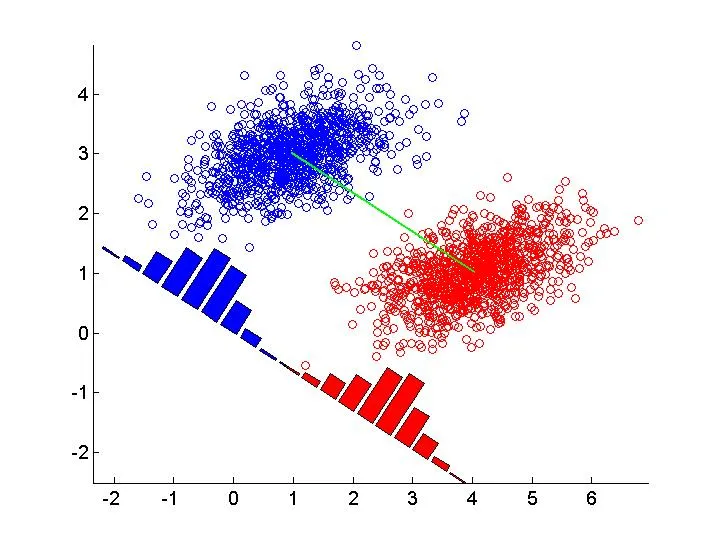

## K Neighbors Classifier	
Determines the label of a test item based on the labels of the k train items that are "nearest" (in Euclidean distance) to it. 

This model does not need training!

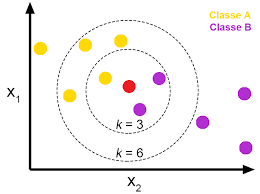

## SVM
Finds the hyperplane  that best separates data points in class 0 from data points in class 1

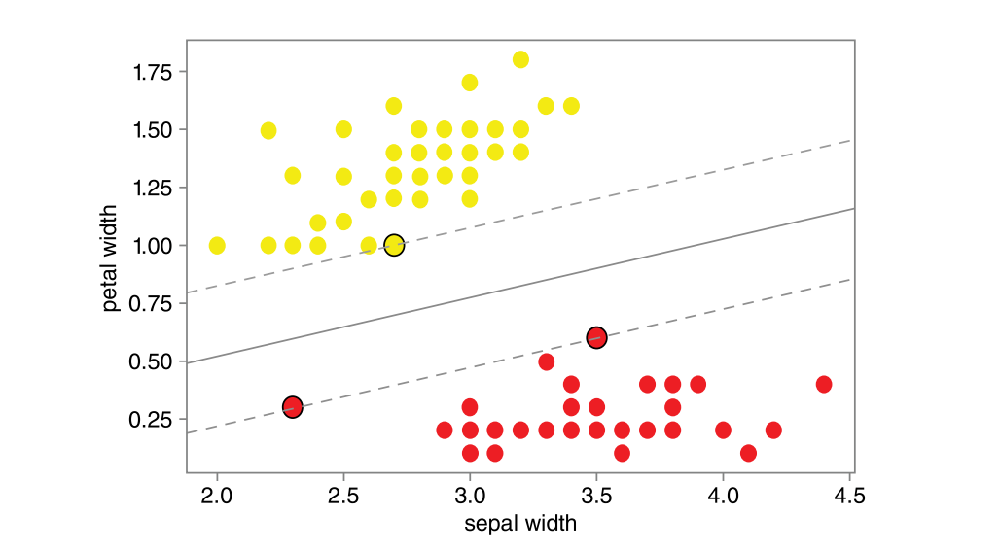

## Naive Bayes

$$p(y|x)=\frac{p(x|y)p(y)}{p(x)}$$
Here $y=0,1$ is the label.

The naive assumption: 
$p(x|y)=p(x_1|y)p(x_2|y)\cdots p(x_d|y)$  

$p(x_i|y)$ can be obtained from actual data by assuming a distribution (Gaussian, binomial, etc.) for the feature $x_i$.

$p(y=0), p(y=1)$ is the fraction of data in class 0 or 1 respectively. 

$p(x)$ is not important because we only want to compare $p(1|x)$ and $p(0|x)$.

## Decision Tree Classifier
At each step makes a decision about the class, based on a feature $x_i$ and a value $c$ i.e. $x_i<c$ belongs to one class and $x_i\geq c$ belongs to the other. 

The decision must give the "best" split of the data. 

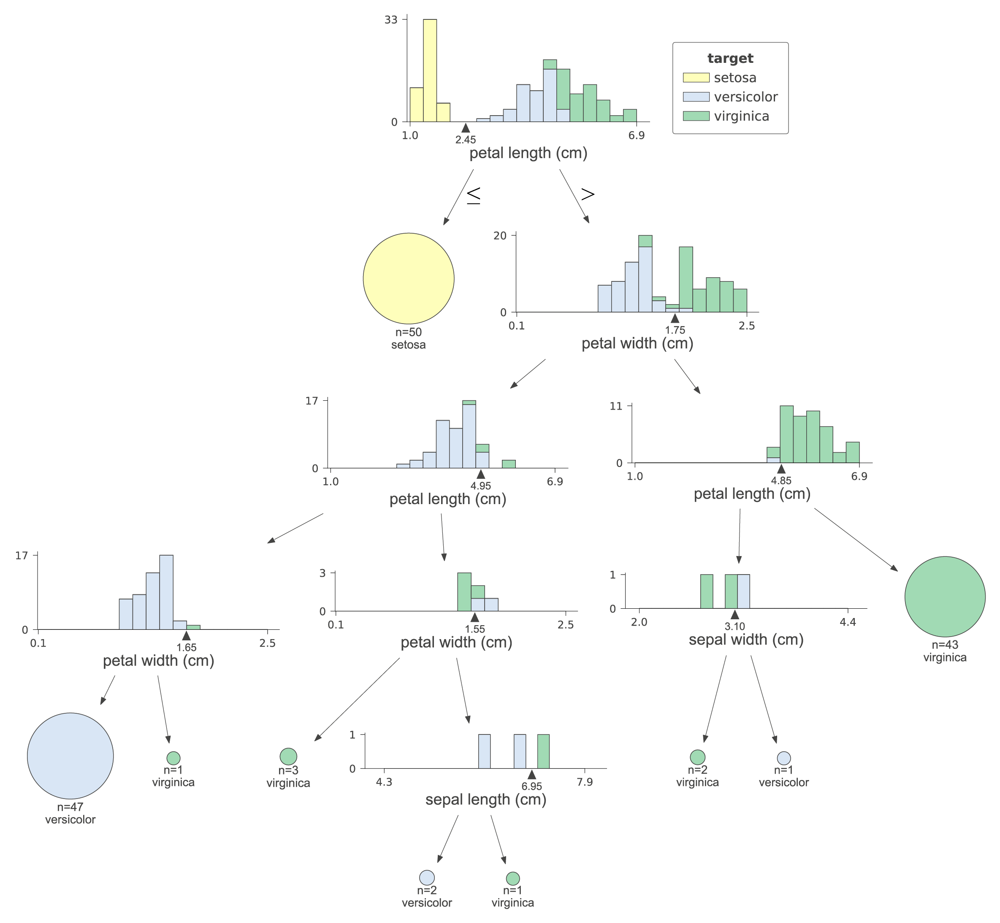


## Boosting classifiers and random forests
In such classifiers, several models are combined, for example several copies of the same model model can be trained on different parts of data. 


## Loss function for binary classification
What is exactly minimized when training a classification model? We call it the **loss (or cost) function**.

In binary classification $y_i=0,1$, but models often predict a number (a probability) $\hat y_i \in [0,1]$. The penalty for the case $y_i=0$ is $-\log (1-\hat y_i)$ and for the case $y_i=0$ it is $-\log \hat y_i$.  We then take the average of these penalties over the training data. This loss function is called _cross entropy_ and it is common for probabilistic classifiers such as logistics regression and (as we'll see later) for neural networks.

Other classifiers such as SVM and decision trees have their own loss function. 

## Description of evaluation metrics for binary classification
The loss function is used for _training_. For _testing_ we evaluate model's generalization capability, i.e. we compare model's predictions on the test dataset with the true labels. We quantify its performance using an _evaluation metric_. 

In a binary classification problem, a data point can have one of these 4 situations:   
True positive (TP)

True negative (TN)

False positive (FP)

False negative (FN)


### Accuracy
Number of correct predictions divied by the number of samples

### Precision
How much of the predicted positives are true? 

P=(TP)/(TP+FP)

How much of what model is predicting is correct?
### Recall
How much of the positives are predicted as positive?
Number of true positives 

R=(TP)/(All positives)

How much of the correct labels is the model predicting?

### F1 score
is the harmonic mean of precision and recall:   
2* R*P/(R+P)

# Analyzing the Model

You can use the `plot_model` function to generate several types of plots and analyzes the performance of a trained model on the test set. It may require re-training the model in certain cases.

This function analyzes the performance of a trained model on the hold-out set. It may require re-training the model in certain cases.

## Confusion matrix

It visualizes the size of true/false positive and true/false negative results.

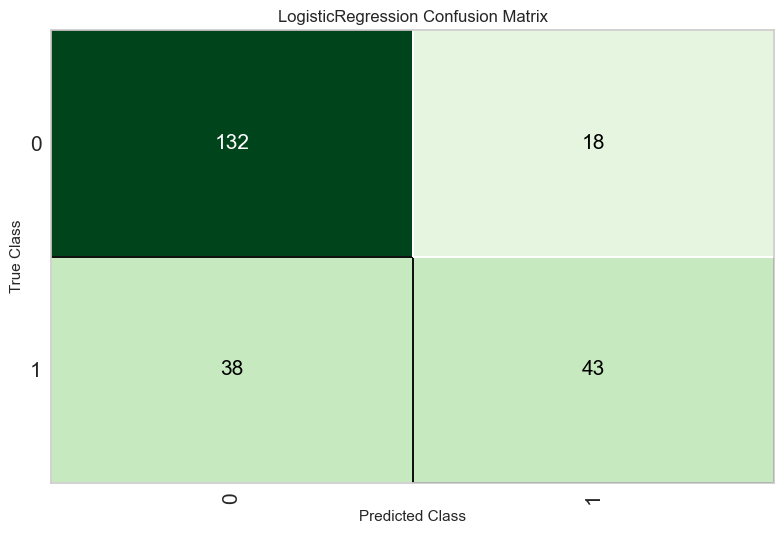

In [9]:
# plot confusion matrix
plot_model(best, plot = 'confusion_matrix')

## ROC Curve
For models that depend on a threshold $\epsilon$, such as Logistic Regression or Naive Baise, ROC Curve, visualizes how the true positive/false positive rate depends on the threshold. 
These models give us a probability $p$ and classification to the classes 0 and 1 depends on whether $p<\epsilon$ or $p>\epsilon$.   

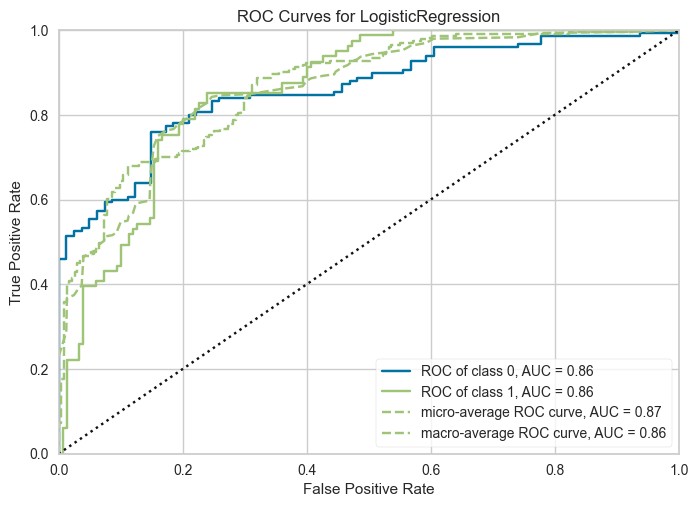

In [9]:
# plot AUC
plot_model(best, plot = 'auc')

## Feature importance
To assess the importance of each feature in a given trained model, we can shuffle (randomize) the values of each feature and measure how model's prediction error changes. If model's performance does not degrade much after randomizing the values of a feature, it is deemed unimportant. 

Note: this notion of feature importance is dependent on the model.


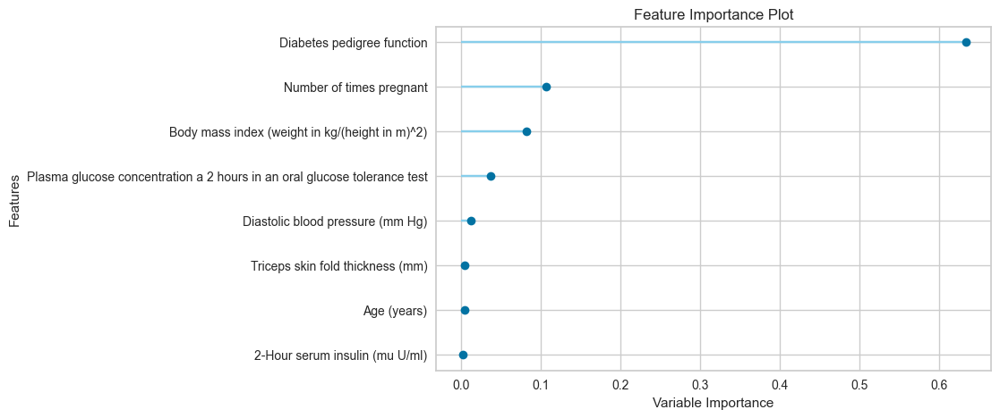

In [11]:
# plot feature importance
plot_model(best, plot = 'feature')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7689,0.8047,0.5602,0.7208,0.6279,0.4641,0.4736,0.0110
ridge,Ridge Classifier,0.7670,0.8060,0.5497,0.7235,0.6221,0.4581,0.4690,0.0080
lda,Linear Discriminant Analysis,0.7670,0.8055,0.5550,0.7202,0.6243,0.4594,0.4695,0.0110
rf,Random Forest Classifier,0.7485,0.7911,0.5284,0.6811,0.5924,0.4150,0.4238,0.0500
nb,Naive Bayes,0.7427,0.7955,0.5702,0.6543,0.6043,0.4156,0.4215,0.0080
catboost,CatBoost Classifier,0.7410,0.7993,0.5278,0.6630,0.5851,0.4005,0.4078,0.6760
gbc,Gradient Boosting Classifier,0.7373,0.7914,0.5550,0.6445,0.5931,0.4013,0.4059,0.0330
ada,Ada Boost Classifier,0.7372,0.7799,0.5275,0.6585,0.5796,0.3926,0.4017,0.0250
et,Extra Trees Classifier,0.7299,0.7788,0.4965,0.6516,0.5596,0.3706,0.3802,0.0410
qda,Quadratic Discriminant Analysis,0.7282,0.7894,0.5281,0.6558,0.5736,0.3785,0.3910,0.0090


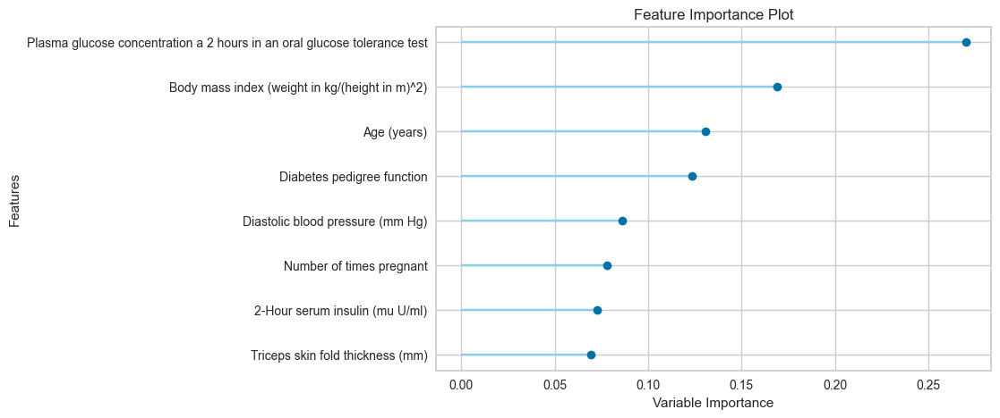

In [13]:
#Computing feature importance for another model

best_models=compare_models(n_select=4)  # Keeps (returns) the 4 best models
plot_model(best_models[3], 'feature')   #best_models[3] is the 4'th best model i.e. Random Forest Classifier

## Low dimensional view of data

The following code returns a 2-dimensional projection of data, obtained using a dimensionality reduction method called t-SNE. This means that the original 8 coordinates (features) are mapped by a nonlinear function into only 2 coordinates, in such a way that nearby data points are mapped to neaby points. 
The two classes are depicted with different classes. 

Note: the coordinates found by this method are not necessarily "good" for the classification problem at hand. The ideal coordinates would be so that the two classes are completely separated from each other! 

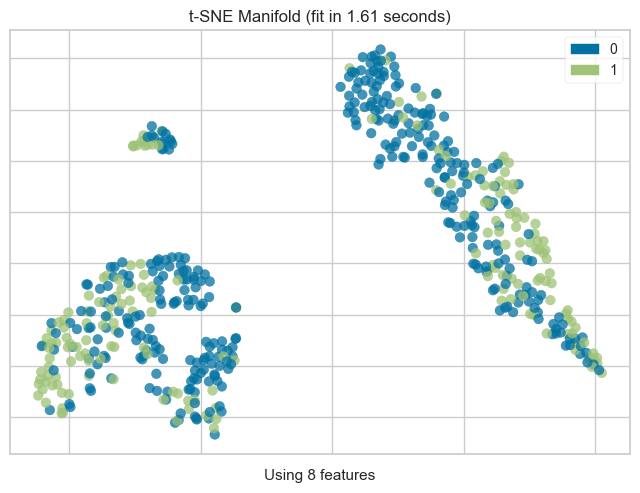

In [8]:
# check docstring to see available plots 
plot_model(best, 'manifold')

To get all these plots in one package you can use the `evaluate_model` function. 

In [10]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

___

## Prediction
The `predict_model` function returns `prediction_label` and `prediction_score` (probability of the predicted class) as new columns in dataframe. When data is `None` (default), it uses the test set (created during the setup function) for scoring.

In [14]:
# predict on test set
holdout_pred = predict_model(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.7576,0.8568,0.5309,0.7049,0.6056,0.4356,0.4447


In [15]:
# show predictions df
holdout_pred.head()

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Class variable,prediction_label,prediction_score
537,6,114,88,0,0,27.799999,0.247,66,0,0,0.8037
538,1,97,70,15,0,18.200001,0.147,21,0,0,0.9648
539,2,90,70,17,0,27.299999,0.085,22,0,0,0.9393
540,2,105,58,40,94,34.900002,0.225,25,0,0,0.7998
541,11,138,76,0,0,33.200001,0.420,35,0,1,0.6391


The same function works for predicting the labels on unseen dataset. Let's create a copy of original data and drop the `Class variable`. We can then use the new data frame without labels for scoring.

In [16]:
# copy data and drop Class variable

new_data = data.copy()
new_data.drop('Class variable', axis=1, inplace=True)
new_data.head()

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years)
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33


In [17]:
# predict model on new_data
predictions = predict_model(best, data = new_data)
predictions.head()

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),prediction_label,prediction_score
0,6,148,72,35,0,33.599998,0.627,50,1,0.6939
1,1,85,66,29,0,26.600000,0.351,31,0,0.9419
2,8,183,64,0,0,23.299999,0.672,32,1,0.7975
3,1,89,66,23,94,28.100000,0.167,21,0,0.9453
4,0,137,40,35,168,43.099998,2.288,33,1,0.8393


## Save Model

Finally, you can save the entire pipeline on disk for later use, using pycaret's `save_model` function.

In [11]:
# save pipeline
save_model(best, 'my_first_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Number of times pregnant',
                                              'Plasma glucose concentration a 2 '
                                              'hours in an oral glucose '
                                              'tolerance test',
                                              'Diastolic blood pressure (mm Hg)',
                                              'Triceps skin fold thickness (mm)',
                                              '2-Hour serum insulin (mu U/ml)',
                                              'Body mass index (weight in '
                                              'kg/(height in m)^2)',
                                              'Diabetes pedigre...
                  TransformerWrapper(exclude=None, include=None,
                                     transformer=CleanC

In [12]:
# load pipeline
loaded_best_pipeline = load_model('my_first_pipeline')
#loaded_best_pipeline

Transformation Pipeline and Model Successfully Loaded


# Binary classification projects for students

Here are two data repositories

### UC Irvine
https://archive.ics.uci.edu/datasets
### Open ML
https://www.openml.org/search?type=data&status=active&qualities.NumberOfClasses=%3D_2

You can choose one, download its CSV file and then load it using the following code:

`from pandas import read_csv
data=read_csv("nameofthefile")`

You can then run the same analysis as above and experiment with the results.

# Exploratory data analysis
Here we analyze individual features and their correlations. 
For a variable (feature):  
**Q1** is the value such that 25% of the samples are smaller than it.  
**Q3** is the value such that 75% of the samples are smaller than it.  
**5th percentile** is the value such that 5% of the samples are smaller than it.   
**95th percentile** is the value such that 95% of the samples are smaller than it.   

The **correlation** between two variables $X,Y$ measures how linearly correlated they are with each other. It can be conferred from the _scatterplot_ of the two variables $X,Y$ too. 

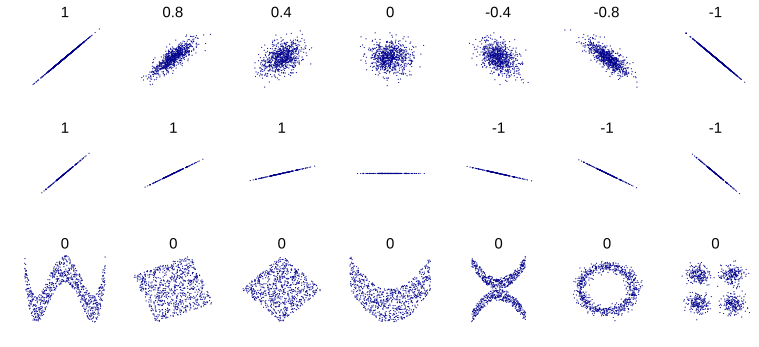

## Using PyCaret

This time we use `profile=True`

In [14]:


data = get_data('diabetes', profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Another method


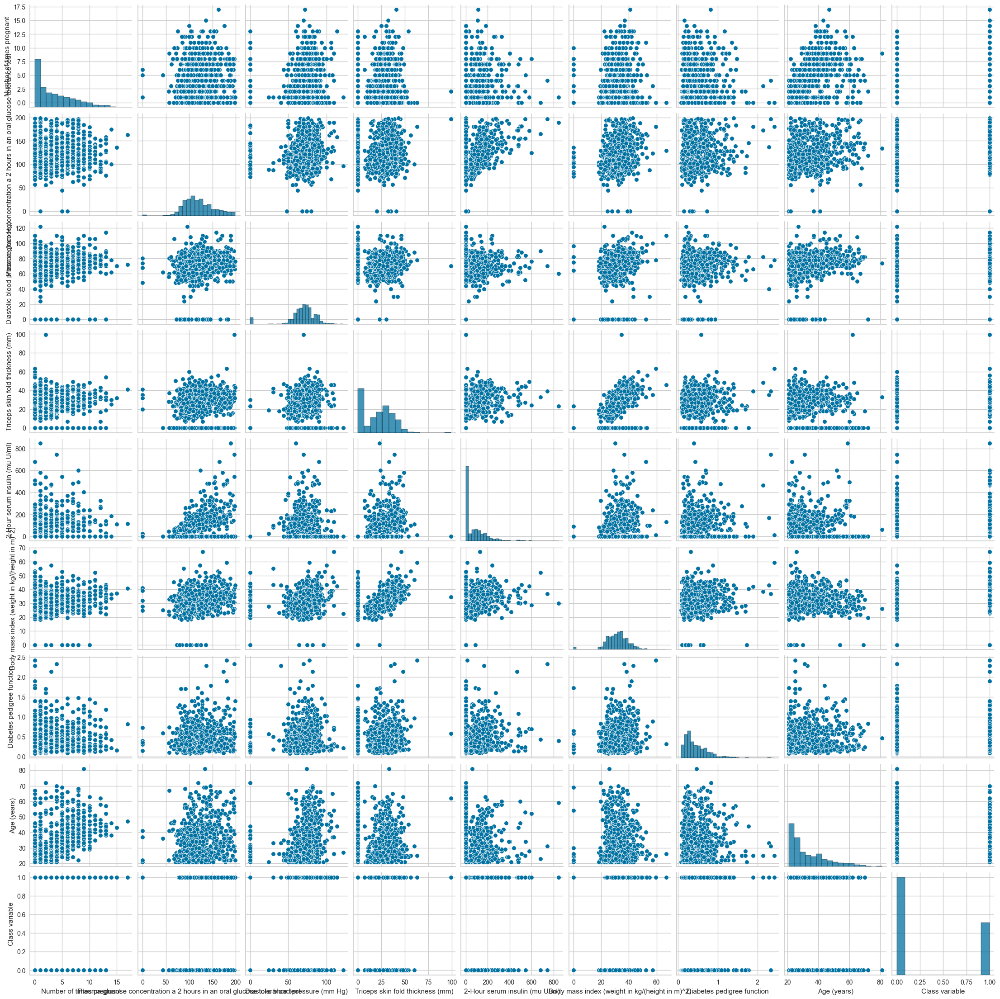

In [17]:
from seaborn import pairplot
pairplot(data)

# Training the model with fewer features


In [15]:

datanew=data[['Number of times pregnant', 'Body mass index (weight in kg/(height in m)^2)', 'Diabetes pedigree function', 'Age (years)', 'Class variable']]
datanew

,Number of times pregnant,Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Class variable
0,6,33.6,0.627,50,1
1,1,26.6,0.351,31,0
2,8,23.3,0.672,32,1
3,1,28.1,0.167,21,0
4,0,43.1,2.288,33,1
...,...,...,...,...,...
763,10,32.9,0.171,63,0
764,2,36.8,0.340,27,0
765,5,26.2,0.245,30,0
766,1,30.1,0.349,47,1


In [23]:
setup(datanew, target='Class variable', normalize=True, session_id=124, normalize_method = 'minmax')

,Description,Value
0,Session id,124
1,Target,Class variable
2,Target type,Binary
3,Original data shape,"(768, 5)"
4,Transformed data shape,"(768, 5)"
5,Transformed train set shape,"(537, 5)"
6,Transformed test set shape,"(231, 5)"
7,Numeric features,4
8,Preprocess,True
9,Imputation type,simple


In [24]:
newbest=compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.6869,0.7310,0.4485,0.5694,0.4950,0.2748,0.2825,0.6340
lr,Logistic Regression,0.6777,0.7318,0.3365,0.5825,0.4228,0.2191,0.2383,0.0100
lda,Linear Discriminant Analysis,0.6777,0.7358,0.3307,0.5828,0.4177,0.2159,0.2361,0.0080
rf,Random Forest Classifier,0.6759,0.7007,0.4325,0.5391,0.4730,0.2467,0.2523,0.0530
ridge,Ridge Classifier,0.6740,0.7358,0.3094,0.5723,0.3972,0.1993,0.2201,0.0090
knn,K Neighbors Classifier,0.6685,0.7129,0.4553,0.5401,0.4871,0.2468,0.2527,0.0160
gbc,Gradient Boosting Classifier,0.6668,0.6961,0.4439,0.5423,0.4730,0.2376,0.2470,0.0310
nb,Naive Bayes,0.6610,0.7254,0.3637,0.5288,0.4271,0.1983,0.2077,0.0090
et,Extra Trees Classifier,0.6572,0.7061,0.4377,0.5097,0.4654,0.2177,0.2214,0.0500
dummy,Dummy Classifier,0.6518,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0100


In [18]:
evaluate_model(newbest)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# 👇 Detailed function-by-function overview

To access all the variables created by the setup function such as transformed dataset, random_state, etc. you can use `get_config` method.

In [21]:
# check all available config
get_config()

{'USI',
 'X',
 'X_test',
 'X_test_transformed',
 'X_train',
 'X_train_transformed',
 'X_transformed',
 '_available_plots',
 '_ml_usecase',
 'data',
 'dataset',
 'dataset_transformed',
 'exp_id',
 'exp_name_log',
 'fix_imbalance',
 'fold_generator',
 'fold_groups_param',
 'fold_shuffle_param',
 'gpu_n_jobs_param',
 'gpu_param',
 'html_param',
 'idx',
 'is_multiclass',
 'log_plots_param',
 'logging_param',
 'memory',
 'n_jobs_param',
 'pipeline',
 'seed',
 'target_param',
 'test',
 'test_transformed',
 'train',
 'train_transformed',
 'variable_and_property_keys',
 'variables',
 'y',
 'y_test',
 'y_test_transformed',
 'y_train',
 'y_train_transformed',
 'y_transformed'}

In [36]:
# lets access X_train_transformed
get_config('X_train_transformed')

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years)
323,0.764706,0.763819,0.789474,0.523810,0.034279,0.399404,0.278822,0.366667
448,0.000000,0.522613,0.561404,0.587302,0.075650,0.500745,0.184458,0.016667
84,0.294118,0.688442,0.947368,0.000000,0.000000,0.727273,0.063621,0.266667
529,0.000000,0.557789,0.570175,0.000000,0.000000,0.366617,0.248506,0.166667
329,0.352941,0.527638,0.614035,0.507937,0.080378,0.459016,0.018787,0.266667
...,...,...,...,...,...,...,...,...
327,0.588235,0.899497,0.614035,0.000000,0.000000,0.523100,0.052092,0.266667
57,0.000000,0.502513,0.771930,0.952381,0.130024,0.697466,0.377455,0.166667
112,0.058824,0.447236,0.666667,0.539683,0.043735,0.464978,0.048676,0.033333
751,0.058824,0.608040,0.684211,0.619048,0.087470,0.581222,0.078138,0.116667


Notice that all the values are between 0 and 1 - that is because we passed `normalize=True` in the `setup` function. If you don't remember how it compares to actual data, no problem - we can also access non-transformed values using `get_config` and then compare. See below and notice the range of values on x-axis and compare it with histogram above.

___

## ✅ Compare Models
This function trains and evaluates the performance of all estimators available in the model library using cross-validation. The output of this function is a scoring grid with average cross-validated scores. Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

`compare_models` by default uses all the estimators in model library (all except models with `Turbo=False`) . To see all available models you can use the function `models()`

In [25]:
# check all the available models
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


You can use the `include` and `exclude` parameter in the `compare_models` to train only select model or exclude specific models from training by passing the model id's in `exclude` parameter.

In [37]:
compare_tree_models = compare_models(include = ['dt', 'rf', 'et', 'gbc', 'xgboost', 'lightgbm', 'catboost'])

ValueError: Estimator xgboost Not Available. Please see docstring for list of available estimators.

The function above has return trained model object as an output. The scoring grid is only displayed and not returned. If you need access to the scoring grid you can use `pull` function to access the dataframe.

In [38]:
compare_tree_models_results = pull()
compare_tree_models_results

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.7708,0.8071,0.5392,0.7353,0.6203,0.4618,0.4744,0.010
lr,Logistic Regression,0.7689,0.8071,0.4959,0.7614,0.5968,0.4453,0.4673,0.905
lda,Linear Discriminant Analysis,0.7670,0.8055,0.5550,0.7202,0.6243,0.4594,0.4695,0.009
svm,SVM - Linear Kernel,0.7521,0.8005,0.5070,0.7363,0.5796,0.4154,0.4398,0.011
rf,Random Forest Classifier,0.7485,0.7917,0.5336,0.6784,0.5946,0.4164,0.4245,0.056
nb,Naive Bayes,0.7427,0.7957,0.5702,0.6543,0.6043,0.4156,0.4215,0.011
catboost,CatBoost Classifier,0.7410,0.7994,0.5278,0.6630,0.5851,0.4005,0.4078,0.714
gbc,Gradient Boosting Classifier,0.7373,0.7914,0.5550,0.6445,0.5931,0.4013,0.4059,0.037
ada,Ada Boost Classifier,0.7372,0.7799,0.5275,0.6585,0.5796,0.3926,0.4017,0.028
et,Extra Trees Classifier,0.7299,0.7788,0.4965,0.6516,0.5596,0.3706,0.3802,0.046


By default `compare_models` return the single best performing model based on the metric defined in the `sort` parameter. Let's change our code to return 3 top models based on `Recall`.

In [39]:
best_recall_models_top3 = compare_models(sort = 'Recall', n_select = 3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,0.7427,0.7957,0.5702,0.6543,0.6043,0.4156,0.4215,0.0090
gbc,Gradient Boosting Classifier,0.7373,0.7914,0.5550,0.6445,0.5931,0.4013,0.4059,0.0350
lda,Linear Discriminant Analysis,0.7670,0.8055,0.5550,0.7202,0.6243,0.4594,0.4695,0.0090
ridge,Ridge Classifier,0.7708,0.8071,0.5392,0.7353,0.6203,0.4618,0.4744,0.0100
rf,Random Forest Classifier,0.7485,0.7917,0.5336,0.6784,0.5946,0.4164,0.4245,0.0510
qda,Quadratic Discriminant Analysis,0.7282,0.7894,0.5281,0.6558,0.5736,0.3785,0.3910,0.0120
catboost,CatBoost Classifier,0.7410,0.7994,0.5278,0.6630,0.5851,0.4005,0.4078,0.6920
ada,Ada Boost Classifier,0.7372,0.7799,0.5275,0.6585,0.5796,0.3926,0.4017,0.0260
lightgbm,Light Gradient Boosting Machine,0.7113,0.7653,0.5181,0.6036,0.5533,0.3427,0.3479,0.0570
dt,Decision Tree Classifier,0.6947,0.6526,0.5137,0.5665,0.5343,0.3103,0.3130,0.0090


Some other parameters that you might find very useful in `compare_models` are:

- fold
- cross_validation
- budget_time
- errors
- probability_threshold
- parallel

You can check the docstring of the function for more info.

In [35]:
help(compare_models)

## ✅ Create Model
This function trains and evaluates the performance of a given estimator using cross-validation. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function. All the available models can be accessed using the models function.

In [10]:
# check all the available models
X=models()
X

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [45]:
# train logistic regression with default fold=10
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.9023,0.5789,0.8462,0.6875,0.5624,0.5828
1,0.8333,0.7970,0.6316,0.8571,0.7273,0.6112,0.6260
2,0.8519,0.9383,0.6316,0.9231,0.7500,0.6499,0.6736
3,0.7222,0.7759,0.4211,0.6667,0.5161,0.3350,0.3524
4,0.8333,0.9083,0.5789,0.9167,0.7097,0.6010,0.6322
5,0.6852,0.6737,0.4211,0.5714,0.4848,0.2656,0.2720
6,0.7222,0.7820,0.4737,0.6429,0.5455,0.3520,0.3605
7,0.7547,0.8460,0.3333,0.8571,0.4800,0.3579,0.4263
8,0.7358,0.6952,0.4444,0.6667,0.5333,0.3592,0.3736


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

The function above has return trained model object as an output. The scoring grid is only displayed and not returned. If you need access to the scoring grid you can use `pull` function to access the dataframe.

In [46]:
lr_results = pull()
#print(type(lr_results))
lr_results

<class 'pandas.core.frame.DataFrame'>


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.9023,0.5789,0.8462,0.6875,0.5624,0.5828
1,0.8333,0.7970,0.6316,0.8571,0.7273,0.6112,0.6260
2,0.8519,0.9383,0.6316,0.9231,0.7500,0.6499,0.6736
3,0.7222,0.7759,0.4211,0.6667,0.5161,0.3350,0.3524
4,0.8333,0.9083,0.5789,0.9167,0.7097,0.6010,0.6322
5,0.6852,0.6737,0.4211,0.5714,0.4848,0.2656,0.2720
6,0.7222,0.7820,0.4737,0.6429,0.5455,0.3520,0.3605
7,0.7547,0.8460,0.3333,0.8571,0.4800,0.3579,0.4263
8,0.7358,0.6952,0.4444,0.6667,0.5333,0.3592,0.3736


In [47]:
# train logistic regression with fold=3
lr = create_model('lr', fold=3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8101,0.8526,0.5714,0.8372,0.6792,0.5510,0.5713
1,0.7486,0.7921,0.5000,0.6889,0.5794,0.4065,0.4172
2,0.7486,0.7804,0.4194,0.7429,0.5361,0.3815,0.4108
Mean,0.7691,0.8084,0.4969,0.7563,0.5983,0.4464,0.4664
Std,0.0290,0.0317,0.0621,0.0613,0.0599,0.0747,0.0742


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [48]:
# train logistic regression with specific model parameters
create_model('lr', C = 0.5, l1_ratio = 0.15)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7963,0.8872,0.4737,0.9000,0.6207,0.4992,0.5472
1,0.8148,0.8030,0.5789,0.8462,0.6875,0.5624,0.5828
2,0.8519,0.9353,0.5789,1.0000,0.7333,0.6406,0.6865
3,0.7037,0.7684,0.3684,0.6364,0.4667,0.2812,0.3013
4,0.8519,0.9038,0.5789,1.0000,0.7333,0.6406,0.6865
5,0.6852,0.6737,0.4211,0.5714,0.4848,0.2656,0.2720
6,0.7222,0.7624,0.4737,0.6429,0.5455,0.3520,0.3605
7,0.7547,0.8302,0.3333,0.8571,0.4800,0.3579,0.4263
8,0.7358,0.6952,0.3333,0.7500,0.4615,0.3193,0.3654


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LogisticRegression(C=0.5, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=0.15, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [49]:
# train lr and return train score as well alongwith CV
create_model('lr', return_train_score=True)

Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [50]:
# change the probability threshold of classifier from 0.5 to 0.66
create_model('lr', probability_threshold = 0.66)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7222,0.9023,0.2105,1.0000,0.3478,0.2569,0.3839
1,0.7407,0.7970,0.2632,1.0000,0.4167,0.3165,0.4336
2,0.7037,0.9383,0.1579,1.0000,0.2727,0.1955,0.3292
3,0.7037,0.7759,0.2105,0.8000,0.3333,0.2188,0.2998
4,0.7037,0.9083,0.1579,1.0000,0.2727,0.1955,0.3292
5,0.6852,0.6737,0.2105,0.6667,0.3200,0.1818,0.2331
6,0.7222,0.7820,0.3158,0.7500,0.4444,0.2981,0.3477
7,0.6981,0.8460,0.1111,1.0000,0.2000,0.1417,0.2761
8,0.7170,0.6952,0.2222,0.8000,0.3478,0.2348,0.3138


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CustomProbabilityThresholdClassifier(C=1.0, class_weight=None,
                                     classifier=LogisticRegression(C=1.0,
                                                                   class_weight=None,
                                                                   dual=False,
                                                                   fit_intercept=True,
                                                                   intercept_scaling=1,
                                                                   l1_ratio=None,
                                                                   max_iter=1000,
                                                                   multi_class='auto',
                                                                   n_jobs=None,
                                                                   penalty='l2',
                                                                   random_state=123,
                                                                   solver='lbfgs',
                                                                   tol=0.0001,
                                                                   verbose=0,
                                                                   warm_start=False),
                                     dual=False, fit_intercept=True,
                                     intercept_scaling=1, l1_ratio=None,
                                     max_iter=1000, multi_class='auto',
                                     n_jobs=None, penalty='l2',
                                     probability_threshold=0.66,
                                     random_state=123, solver='lbfgs',
                                     tol=0.0001, verbose=0, warm_start=False)

Some other parameters that you might find very useful in `create_model` are:

- cross_validation
- engine
- fit_kwargs
- groups

You can check the docstring of the function for more info.

In [51]:
help(create_model)

## ✅ Tune Model Hyperparameters

This function tunes the hyperparameters of the model. The output of this function is a scoring grid with cross-validated scores by fold. The best model is selected based on the metric defined in optimize parameter. 

Metrics evaluated during cross-validation can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

In [45]:
# train a dt model with default params
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.9038,0.5789,0.8462,0.6875,0.5624,0.5828
1,0.8333,0.7985,0.6316,0.8571,0.7273,0.6112,0.6260
2,0.8519,0.9383,0.6316,0.9231,0.7500,0.6499,0.6736
3,0.7222,0.7759,0.4211,0.6667,0.5161,0.3350,0.3524
4,0.8333,0.9083,0.5789,0.9167,0.7097,0.6010,0.6322
5,0.6852,0.6737,0.4211,0.5714,0.4848,0.2656,0.2720
6,0.7222,0.7820,0.4737,0.6429,0.5455,0.3520,0.3605
7,0.7547,0.8460,0.3333,0.8571,0.4800,0.3579,0.4263
8,0.7358,0.6952,0.4444,0.6667,0.5333,0.3592,0.3736


In [46]:
# tune hyperparameters of dt
tuned_lr = tune_model(lr, optimize = 'F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8704,0.9038,0.7368,0.8750,0.8000,0.7051,0.7108
1,0.8148,0.7835,0.6316,0.8000,0.7059,0.5735,0.5820
2,0.8704,0.9323,0.6842,0.9286,0.7879,0.6976,0.7145
3,0.7222,0.7759,0.4737,0.6429,0.5455,0.3520,0.3605
4,0.8704,0.9128,0.6842,0.9286,0.7879,0.6976,0.7145
5,0.6667,0.6692,0.3684,0.5385,0.4375,0.2123,0.2200
6,0.7407,0.8000,0.5789,0.6471,0.6111,0.4176,0.4190
7,0.7736,0.8730,0.4444,0.8000,0.5714,0.4342,0.4688
8,0.6604,0.6810,0.4444,0.5000,0.4706,0.2219,0.2227


Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [47]:
lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [48]:
tuned_lr

LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

The default search algorithm is `RandomizedSearchCV` from `sklearn`. This can be changed by using `search_library` and `search_algorithm` parameter.

For more details on all available `search_library` and `search_algorithm` please check the docstring. Some other parameters that you might find very useful in `tune_model` are:

- choose_better
- n_iter
- early_stopping
- groups

You can check the docstring of the function for more info.

In [60]:
# help(tune_model)

## ✅ Ensemble Model

This function ensembles a given estimator. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

In [51]:
# ensemble with bagging
dt=create_model('dt')
ensemble_model(dt, method = 'Bagging')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7222,0.6774,0.5263,0.6250,0.5714,0.3682,0.3711
1,0.7222,0.7015,0.6316,0.6000,0.6154,0.3982,0.3985
2,0.7407,0.7038,0.5789,0.6471,0.6111,0.4176,0.4190
3,0.5926,0.5053,0.2105,0.3636,0.2667,0.0116,0.0125
4,0.7778,0.7684,0.7368,0.6667,0.7000,0.5242,0.5259
5,0.6296,0.5940,0.4737,0.4737,0.4737,0.1880,0.1880
6,0.6296,0.5699,0.3684,0.4667,0.4118,0.1469,0.1491
7,0.8302,0.7770,0.6111,0.8462,0.7097,0.5940,0.6098
8,0.6604,0.6079,0.4444,0.5000,0.4706,0.2219,0.2227


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7407,0.8383,0.5263,0.6667,0.5882,0.4028,0.4088
1,0.7963,0.7797,0.7368,0.7000,0.7179,0.5587,0.5591
2,0.7593,0.7669,0.4737,0.7500,0.5806,0.4236,0.4456
3,0.7222,0.7842,0.5263,0.6250,0.5714,0.3682,0.3711
4,0.8148,0.8421,0.7368,0.7368,0.7368,0.5940,0.5940
5,0.6852,0.6759,0.4211,0.5714,0.4848,0.2656,0.2720
6,0.7037,0.7677,0.5263,0.5882,0.5556,0.3344,0.3355
7,0.7925,0.8405,0.4444,0.8889,0.5926,0.4734,0.5245
8,0.6792,0.6659,0.5000,0.5294,0.5143,0.2751,0.2754


BaggingClassifier(bootstrap=True, bootstrap_features=False,
                  estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                   class_weight=None,
                                                   criterion='gini',
                                                   max_depth=None,
                                                   max_features=None,
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   monotonic_cst=None,
                                                   random_state=123,
                                                   splitter='best'),
                  max_features=1.0, max_samples=1.0, n_estimators=10,
                  n_jobs=None, oob_score=False, random_state=123, verbose=0,
                  warm_start=False)

In [52]:
# ensemble with boosting
ensemble_model(dt, method = 'Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7222,0.6895,0.5789,0.6111,0.5946,0.3836,0.3839
1,0.7222,0.6774,0.5263,0.6250,0.5714,0.3682,0.3711
2,0.7593,0.7421,0.6842,0.6500,0.6667,0.4785,0.4788
3,0.6111,0.5436,0.3158,0.4286,0.3636,0.0928,0.0950
4,0.8148,0.8211,0.8421,0.6957,0.7619,0.6126,0.6201
5,0.5926,0.5654,0.4737,0.4286,0.4500,0.1278,0.1282
6,0.6667,0.6226,0.4737,0.5294,0.5000,0.2512,0.2520
7,0.7925,0.7484,0.6111,0.7333,0.6667,0.5178,0.5223
8,0.6604,0.6214,0.5000,0.5000,0.5000,0.2429,0.2429


AdaBoostClassifier(algorithm='SAMME.R',
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    monotonic_cst=None,
                                                    random_state=123,
                                                    splitter='best'),
                   learning_rate=1.0, n_estimators=10, random_state=123)

Some other parameters that you might find very useful in `ensemble_model` are:

- choose_better
- n_estimators
- groups
- fit_kwargs
- probability_threshold
- return_train_score

You can check the docstring of the function for more info.

In [63]:
# help(ensemble_model)

## ✅ Blend Models

This function trains a Soft Voting / Majority Rule classifier for select models passed in the estimator_list parameter. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

In [64]:
# top 3 models based on recall
best_recall_models_top3

[GaussianNB(priors=None, var_smoothing=1e-09),
 GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                            learning_rate=0.1, loss='log_loss', max_depth=3,
                            max_features=None, max_leaf_nodes=None,
                            min_impurity_decrease=0.0, min_samples_leaf=1,
                            min_samples_split=2, min_weight_fraction_leaf=0.0,
                            n_estimators=100, n_iter_no_change=None,
                            random_state=123, subsample=1.0, tol=0.0001,
                            validation_fraction=0.1, verbose=0,
                            warm_start=False),
 LinearDiscriminantAnalysis(covariance_estimator=None, n_components=None,
                            priors=None, shrinkage=None, solver='svd',
                            store_covariance=False, tol=0.0001)]

In [65]:
# blend top 3 models
blend_models(best_recall_models_top3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7963,0.8932,0.6842,0.7222,0.7027,0.5479,0.5484
1,0.7778,0.8120,0.6316,0.7059,0.6667,0.5008,0.5025
2,0.8704,0.9338,0.6842,0.9286,0.7879,0.6976,0.7145
3,0.7037,0.7865,0.4737,0.6000,0.5294,0.3175,0.3223
4,0.8704,0.8962,0.6842,0.9286,0.7879,0.6976,0.7145
5,0.7037,0.6692,0.4737,0.6000,0.5294,0.3175,0.3223
6,0.7407,0.7805,0.6842,0.6190,0.6500,0.4449,0.4463
7,0.7736,0.8667,0.4444,0.8000,0.5714,0.4342,0.4688
8,0.6604,0.6889,0.4444,0.5000,0.4706,0.2219,0.2227


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

VotingClassifier(estimators=[('Naive Bayes',
                              GaussianNB(priors=None, var_smoothing=1e-09)),
                             ('Gradient Boosting Classifier',
                              GradientBoostingClassifier(ccp_alpha=0.0,
                                                         criterion='friedman_mse',
                                                         init=None,
                                                         learning_rate=0.1,
                                                         loss='log_loss',
                                                         max_depth=3,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_wei...
                                                         n_iter_no_change=None,
                                                         random_state=123,
                                                         subsample=1.0,
                                                         tol=0.0001,
                                                         validation_fraction=0.1,
                                                         verbose=0,
                                                         warm_start=False)),
                             ('Linear Discriminant Analysis',
                              LinearDiscriminantAnalysis(covariance_estimator=None,
                                                         n_components=None,
                                                         priors=None,
                                                         shrinkage=None,
                                                         solver='svd',
                                                         store_covariance=False,
                                                         tol=0.0001))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='soft', weights=None)

Some other parameters that you might find very useful in `blend_models` are:

- choose_better
- method
- weights
- fit_kwargs
- probability_threshold
- return_train_score

You can check the docstring of the function for more info.

In [66]:
# help(blend_models)

## ✅ Stack Models

This function trains a meta-model over select estimators passed in the estimator_list parameter. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

In [67]:
# stack models
stack_models(best_recall_models_top3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.9023,0.6316,0.8000,0.7059,0.5735,0.5820
1,0.7963,0.7970,0.6316,0.7500,0.6857,0.5367,0.5410
2,0.8704,0.9233,0.6842,0.9286,0.7879,0.6976,0.7145
3,0.7037,0.7835,0.4737,0.6000,0.5294,0.3175,0.3223
4,0.8519,0.8992,0.6316,0.9231,0.7500,0.6499,0.6736
5,0.6852,0.6722,0.4211,0.5714,0.4848,0.2656,0.2720
6,0.7222,0.7910,0.5263,0.6250,0.5714,0.3682,0.3711
7,0.7547,0.8667,0.3889,0.7778,0.5185,0.3776,0.4184
8,0.6981,0.6810,0.4444,0.5714,0.5000,0.2886,0.2933


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

StackingClassifier(cv=5,
                   estimators=[('Naive Bayes',
                                GaussianNB(priors=None, var_smoothing=1e-09)),
                               ('Gradient Boosting Classifier',
                                GradientBoostingClassifier(ccp_alpha=0.0,
                                                           criterion='friedman_mse',
                                                           init=None,
                                                           learning_rate=0.1,
                                                           loss='log_loss',
                                                           max_depth=3,
                                                           max_features=None,
                                                           max_leaf_nodes=None,
                                                           min_impurity_decrease=0.0,
                                                           min_samples_leaf=1,
                                                           min_samples_split=2,...
                                                           solver='svd',
                                                           store_covariance=False,
                                                           tol=0.0001))],
                   final_estimator=LogisticRegression(C=1.0, class_weight=None,
                                                      dual=False,
                                                      fit_intercept=True,
                                                      intercept_scaling=1,
                                                      l1_ratio=None,
                                                      max_iter=1000,
                                                      multi_class='auto',
                                                      n_jobs=None, penalty='l2',
                                                      random_state=123,
                                                      solver='lbfgs',
                                                      tol=0.0001, verbose=0,
                                                      warm_start=False),
                   n_jobs=-1, passthrough=True, stack_method='auto', verbose=0)

Some other parameters that you might find very useful in `stack_models` are:

- choose_better
- meta_model
- method
- restack
- probability_threshold
- return_train_score

You can check the docstring of the function for more info.

In [68]:
# help(stack_models)

## ✅ Interpret Model

This function analyzes the predictions generated from a trained model. Most plots in this function are implemented based on the SHAP (Shapley Additive exPlanations). For more info on this, please see https://shap.readthedocs.io/en/latest/

In [27]:
# train lightgbm model
lightgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7593,0.8286,0.5263,0.7143,0.6061,0.4384,0.4490
1,0.6481,0.7053,0.4737,0.5000,0.4865,0.2192,0.2194
2,0.6852,0.7489,0.6316,0.5455,0.5854,0.3338,0.3361
3,0.6111,0.6662,0.2632,0.4167,0.3226,0.0690,0.0725
4,0.6481,0.6602,0.3158,0.5000,0.3871,0.1576,0.1658
5,0.6111,0.6436,0.5263,0.4545,0.4878,0.1771,0.1783
6,0.6296,0.6571,0.4211,0.4706,0.4444,0.1680,0.1685
7,0.6038,0.6206,0.3889,0.4118,0.4000,0.1046,0.1047
8,0.6792,0.7079,0.5000,0.5294,0.5143,0.2751,0.2754


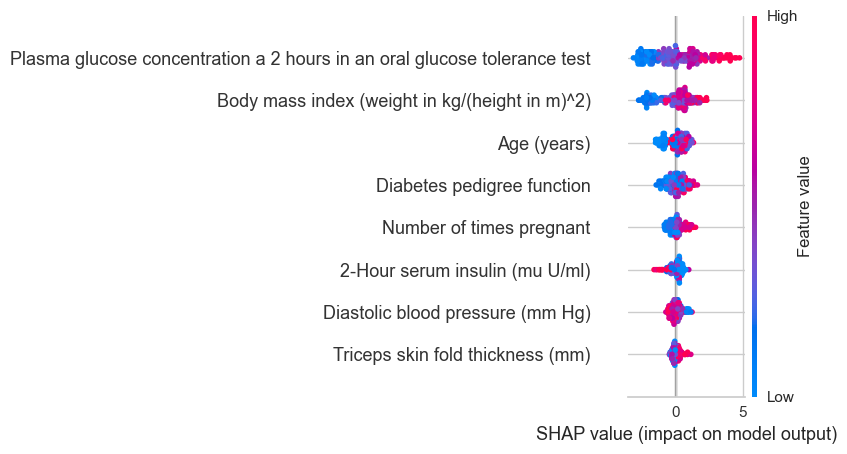

In [74]:
# interpret summary model
interpret_model(lightgbm, plot = 'summary')

In [28]:
# reason plot for test set observation 1
interpret_model(lightgbm, plot = 'reason', observation = 1)

Some other parameters that you might find very useful in `interpret_model` are:

- plot
- feature
- use_train_data
- X_new_sample
- y_new_sample
- save

You can check the docstring of the function for more info.

In [53]:
help(interpret_model)

Help on function interpret_model in module pycaret.classification.functional:

interpret_model(estimator, plot: str = 'summary', feature: Optional[str] = None, observation: Optional[int] = None, use_train_data: bool = False, X_new_sample: Optional[pandas.core.frame.DataFrame] = None, y_new_sample: Optional[pandas.core.frame.DataFrame] = None, save: Union[str, bool] = False, **kwargs)
    This function takes a trained model object and returns an interpretation plot
    based on the test / hold-out set.
    
    This function is implemented based on the SHAP (SHapley Additive exPlanations),
    which is a unified approach to explain the output of any machine learning model.
    SHAP connects game theory with local explanations.
    
    For more information: https://shap.readthedocs.io/en/latest/
    
    For more information on Partial Dependence Plot: https://github.com/SauceCat/PDPbox
    
    
    Example
    -------
    >>> from pycaret.datasets import get_data
    >>> juice = get_d

## ✅ Calibrate Model

This function calibrates the probability of a given model using isotonic or logistic regression. The output of this function is a scoring grid with CV scores by fold. 

Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

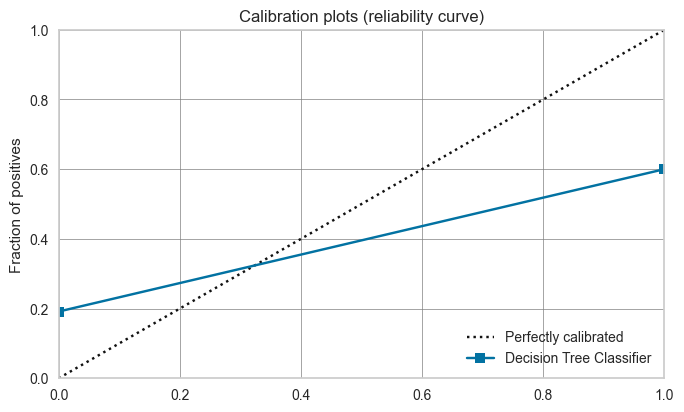

In [77]:
# check calbiration of default dt
plot_model(dt, plot = 'calibration')

In [78]:
# calibrate default dt
calibrated_dt = calibrate_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7037,0.7338,0.1579,1.0000,0.2727,0.1955,0.3292
1,0.6296,0.6767,0.1053,0.4000,0.1667,0.0235,0.0322
2,0.6667,0.7677,0.0526,1.0000,0.1000,0.0672,0.1864
3,0.6667,0.6940,0.2105,0.5714,0.3077,0.1459,0.1774
4,0.6481,0.7962,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.5926,0.6045,0.1053,0.2857,0.1538,-0.0439,-0.0534
6,0.7222,0.6752,0.2105,1.0000,0.3478,0.2569,0.3839
7,0.7358,0.7476,0.2222,1.0000,0.3636,0.2740,0.3984
8,0.6226,0.6151,0.1111,0.3333,0.1667,-0.0038,-0.0047


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

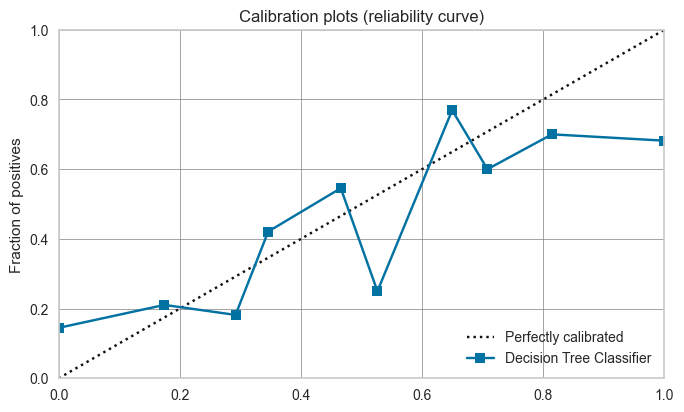

In [79]:
# check calbiration of calibrated dt
plot_model(calibrated_dt, plot = 'calibration')

Some other parameters that you might find very useful in `calibrate_model` are:

- calibrate_fold
- fit_kwargs
- method
- return_train_score
- groups

You can check the docstring of the function for more info.

In [80]:
# help(calibrate_model)

## ✅ Check Fairness

There are many approaches to conceptualizing fairness. The check_fairness function follows the approach known as group fairness, which asks: which groups of individuals are at risk for experiencing harm. `check_fairness` provides fairness-related metrics between different groups (also called sub-population).

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.7489,0.6902,0.4938,0.7018,0.5797,0.4083,0.4211


,Samples,Accuracy,Recall,Precision,F1,Kappa,MCC,Selection Rate
Number of times pregnant,,,,,,,,
0,27,0.814815,0.666667,0.571429,0.615385,0.494382,0.496929,0.259259
1,49,0.734694,0.181818,0.333333,0.235294,0.091298,0.097443,0.122449
2,27,0.888889,0.5,1.0,0.666667,0.608696,0.661438,0.111111
3,21,0.761905,0.5,0.8,0.615385,0.455959,0.482382,0.238095
4,23,0.652174,0.333333,0.333333,0.333333,0.098039,0.098039,0.26087
5,21,0.714286,0.375,0.75,0.5,0.329787,0.36863,0.190476
6,18,0.722222,0.571429,0.666667,0.615385,0.4,0.402911,0.333333
7,13,0.692308,0.5,1.0,0.666667,0.434783,0.527046,0.307692
8,12,0.666667,0.333333,1.0,0.5,0.333333,0.447214,0.166667


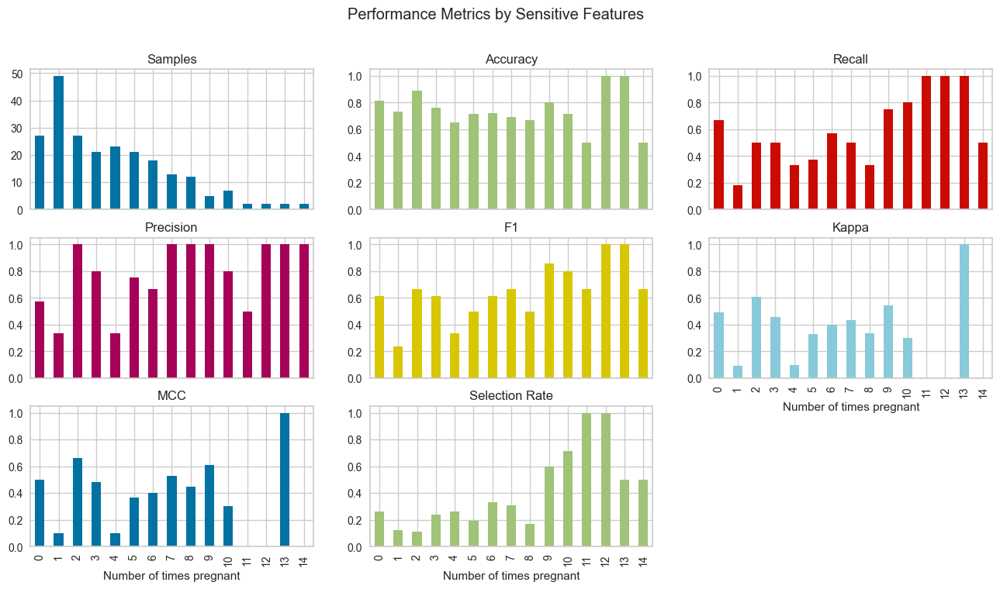

In [85]:
# check fairness
check_fairness(best, sensitive_features = ['Number of times pregnant'])

## ✅Create App
This function creates a basic gradio app for inference.

In [55]:
# create gradio app
create_app(best)

* Running on local URL:  http://127.0.0.1:7861

To create a public link, set `share=True` in `launch()`.


## ✅ Finalize Model
This function trains a given model on the entire dataset including the hold-out set.

In [96]:
final_best = finalize_model(best)

## ✅ Convert Model
This function transpiles the trained machine learning model's decision function in different programming languages such as Python, C, Java, Go, C#, etc. It is very useful if you want to deploy models into environments where you can't install your normal Python stack to support model inference.

In [98]:
# transpiles learned function to java
print(convert_model(best, language = 'java'))

public class Model {
    public static double score(double[] input) {
        return -2.4222329408494767 + input[0] * 0.5943492729771869 + input[1] * 2.3273354603187455 + input[2] * -0.41637843900032867 + input[3] * 0.10259178891131746 + input[4] * -0.3134524281639536 + input[5] * 1.4903417391961826 + input[6] * 0.5019685413792472 + input[7] * 0.12389520576261319;
    }
}



## ✅ Deploy Model
This function deploys the entire ML pipeline on the cloud.

**AWS:**  When deploying model on AWS S3, environment variables must be configured using the command-line interface. To configure AWS environment variables, type `aws configure` in terminal. The following information is required which can be generated using the Identity and Access Management (IAM) portal of your amazon console account:

- AWS Access Key ID
- AWS Secret Key Access
- Default Region Name (can be seen under Global settings on your AWS console)
- Default output format (must be left blank)

**GCP:** To deploy a model on Google Cloud Platform ('gcp'), the project must be created using the command-line or GCP console. Once the project is created, you must create a service account and download the service account key as a JSON file to set environment variables in your local environment. Learn more about it: https://cloud.google.com/docs/authentication/production

**Azure:** To deploy a model on Microsoft Azure ('azure'), environment variables for the connection string must be set in your local environment. Go to settings of storage account on Azure portal to access the connection string required.
AZURE_STORAGE_CONNECTION_STRING (required as environment variable)
Learn more about it: https://docs.microsoft.com/en-us/azure/storage/blobs/storage-quickstart-blobs-python?toc=%2Fpython%2Fazure%2FTOC.json

In [99]:
# deploy model on aws s3
# deploy_model(best, model_name = 'my_first_platform_on_aws',
#             platform = 'aws', authentication = {'bucket' : 'pycaret-test'})

In [100]:
# load model from aws s3
# loaded_from_aws = load_model(model_name = 'my_first_platform_on_aws', platform = 'aws',
#                              authentication = {'bucket' : 'pycaret-test'})

# loaded_from_aws

## ✅ Save / Load Experiment
This function saves all the experiment variables on disk, allowing to later resume without rerunning the setup function.

In [103]:
# save experiment
save_experiment('my_experiment')

In [104]:
# load experiment from disk
exp_from_disk = load_experiment('my_experiment', data=data)

,Description,Value
0,Session id,123
1,Target,Class variable
2,Target type,Binary
3,Original data shape,"(768, 9)"
4,Transformed data shape,"(768, 9)"
5,Transformed train set shape,"(537, 9)"
6,Transformed test set shape,"(231, 9)"
7,Numeric features,8
8,Preprocess,True
9,Imputation type,simple
